In [1]:
import numpy as np

import lsst.daf.persistence as dafPersist
import lsst.afw.image as afwImage

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
detectorOrder = [6, 7, 8, 3, 4, 5, 0, 1, 2]
groupId2 = "20200727_2114"
expId2 = 2020072700001
groupId = "20200728_1920"
expId = 2020072800035
rerun = "CALSET_" + groupId
calib = "CALIB_" + groupId
rerun2 = "CALSET_" + groupId2
calib2 = "CALIB_" + groupId2
dataType = "bias"
# dataType = "dark"
# dataType = "flat"

In [3]:
rootDir = "/project/shared/comCam/"
rerunDir = rootDir + "rerun/" + rerun
calibDir = "/project/shared/comCam/" + calib
calibDir2 = "/project/shared/comCam/" + calib2
calibButler = dafPersist.Butler(root=rootDir, calibRoot=calibDir)
calibButler2 = dafPersist.Butler(root=rootDir, calibRoot=calibDir2)

In [4]:
calibButler.getUri(dataType, dataId={'expId': expId, 'detector': 8})

'/project/shared/comCam/CALIB_20200728_1920/bias/2020-07-28/bias-R22-S22-det008_2020-07-28.fits'

In [5]:
bias = calibButler.get("bias", dataId={'expId': expId, 'detector': 8})
biasMd = calibButler.get("bias" + "_md", dataId={'expId': expId, 'detector': 8})
camera = calibButler.get("camera")
saturationList = [1e12]*9
for ccd in camera:
    amps = ccd.getAmplifiers()
    for amp in amps:
        saturationList[ccd.getId()] = min(saturationList[ccd.getId()], amp.getSaturation())
print(saturationList)

[142857.0, 142857.0, 142857.0, 142857.0, 142857.0, 142857.0, 142857.0, 142857.0, 142857.0]


In [6]:
def plotImages(expId, dataType, variance=False, signalToNoise=False, cmap="viridis", vMin=None, vMax=None):
    fig, axes = plt.subplots(3,3, figsize=(13, 13), constrained_layout=True)
    dataArrList = []
    vmin, vmax = 1e12, -1e12
    subTypeStr = ""
    for iCcd, ax in enumerate(axes.flatten()):
        detNum = detectorOrder[iCcd]
        dataId = {'expId': expId, 'detector': detNum}
        dataImage = calibButler.get(dataType, dataId=dataId)
        dataArr = dataImage.maskedImage.image.array
        if variance:
            subTypeStr = "variance"
            dataArr = dataImage.maskedImage.variance.array
        if signalToNoise:
            subTypeStr = "S/N"
            dataArr /= np.sqrt(dataImage.maskedImage.variance.array)
        dataArrList.append(dataArr)
        if vMin is None:
            vmin = min(vmin, np.percentile(dataArr.ravel(), 1))
        else:
            vmin = vMin
        if vMax is None:
            vmax = max(vmax, np.percentile(dataArr.ravel(), 99))
        else:
            vmax = vMax
    for iCcd, ax in enumerate(axes.flatten()):
        detNum = detectorOrder[iCcd]
        # dataId = {'expId': expId, 'detector': detNum}
        # dataImage = calibButler.get(dataType, dataId=dataId)
        arr = dataArrList[iCcd]  # dataImage.maskedImage.image.array
        ax.imshow(arr, vmin=vmin, vmax=vmax,  origin='lower', cmap=cmap, interpolation='nearest')
        ax.set_title("Det: {}".format(detNum), fontsize=12)
    mappable = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    mappable._A = []
    caxDim = [1.01, 0.04, 0.02, 0.92]
    cax = fig.add_axes(caxDim)
    plt.colorbar(mappable, cax=cax)
    plt.suptitle("Rerun: {}  {} {} expId: {}".format(rerun, dataType, subTypeStr, expId), fontsize=14, y=1.01)

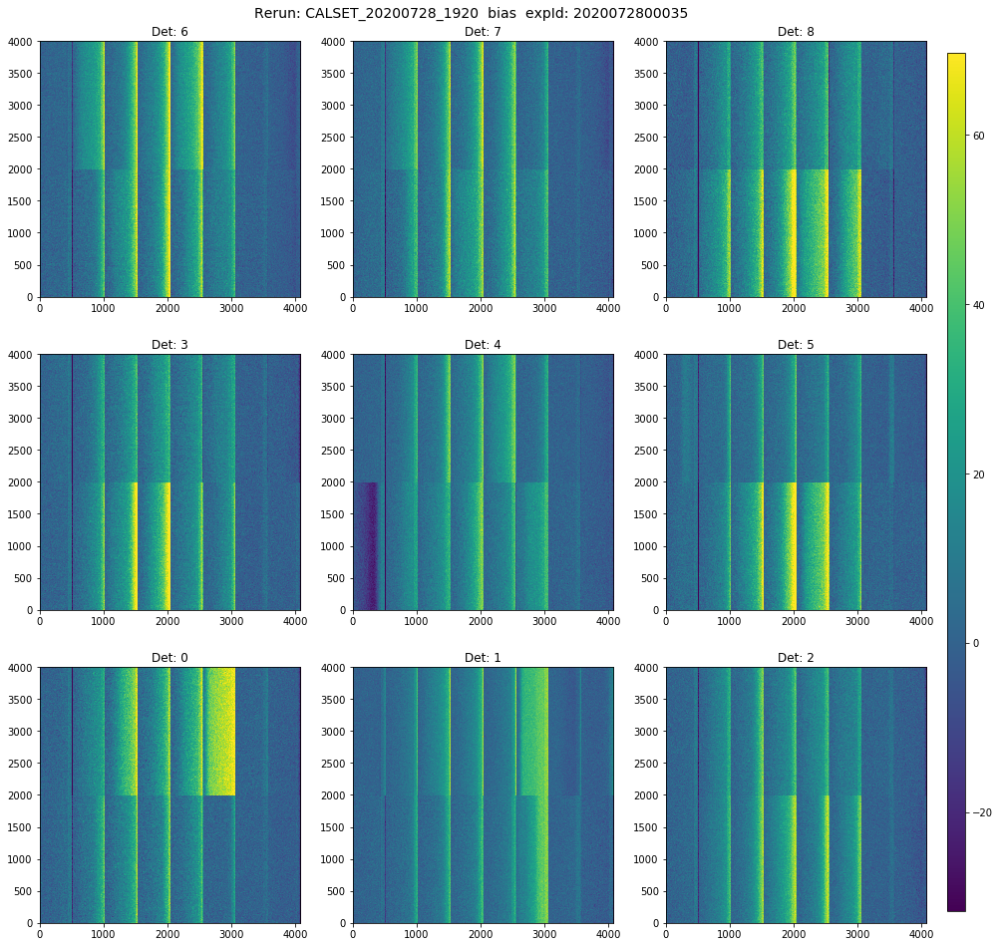

In [7]:
plotImages(expId, dataType)

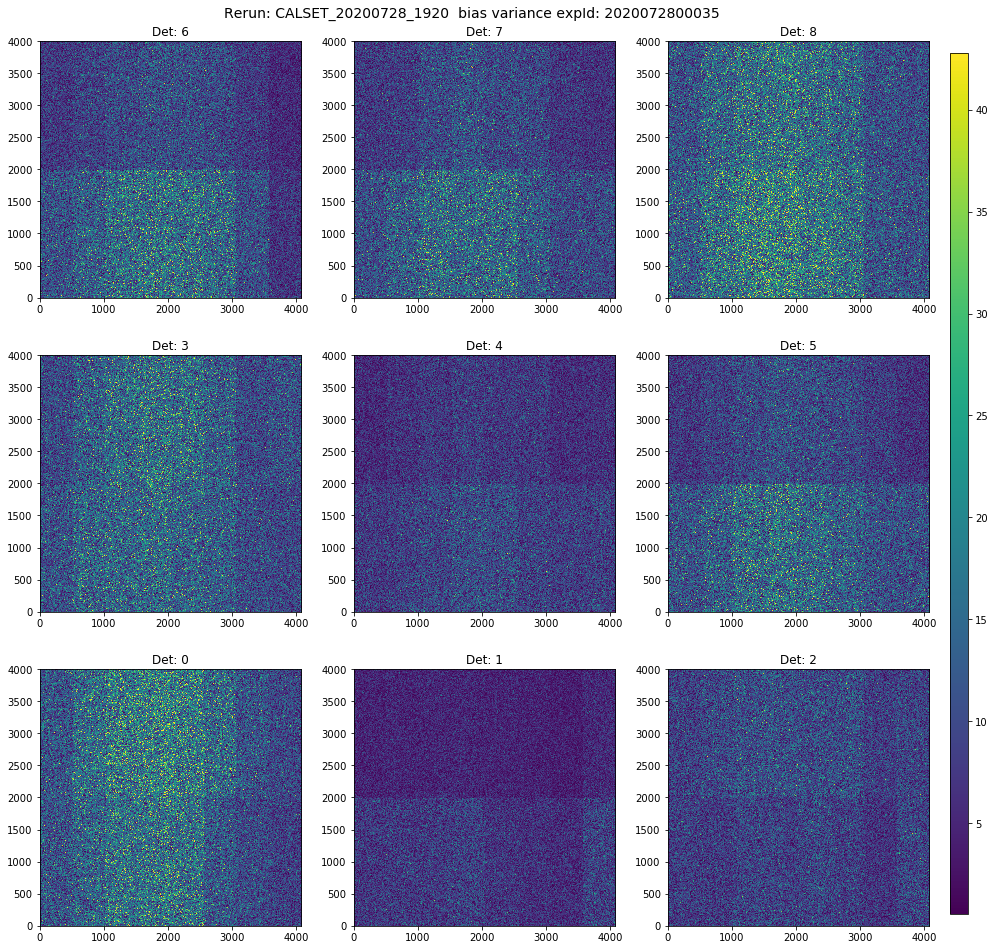

In [8]:
plotImages(expId, dataType, variance=True)

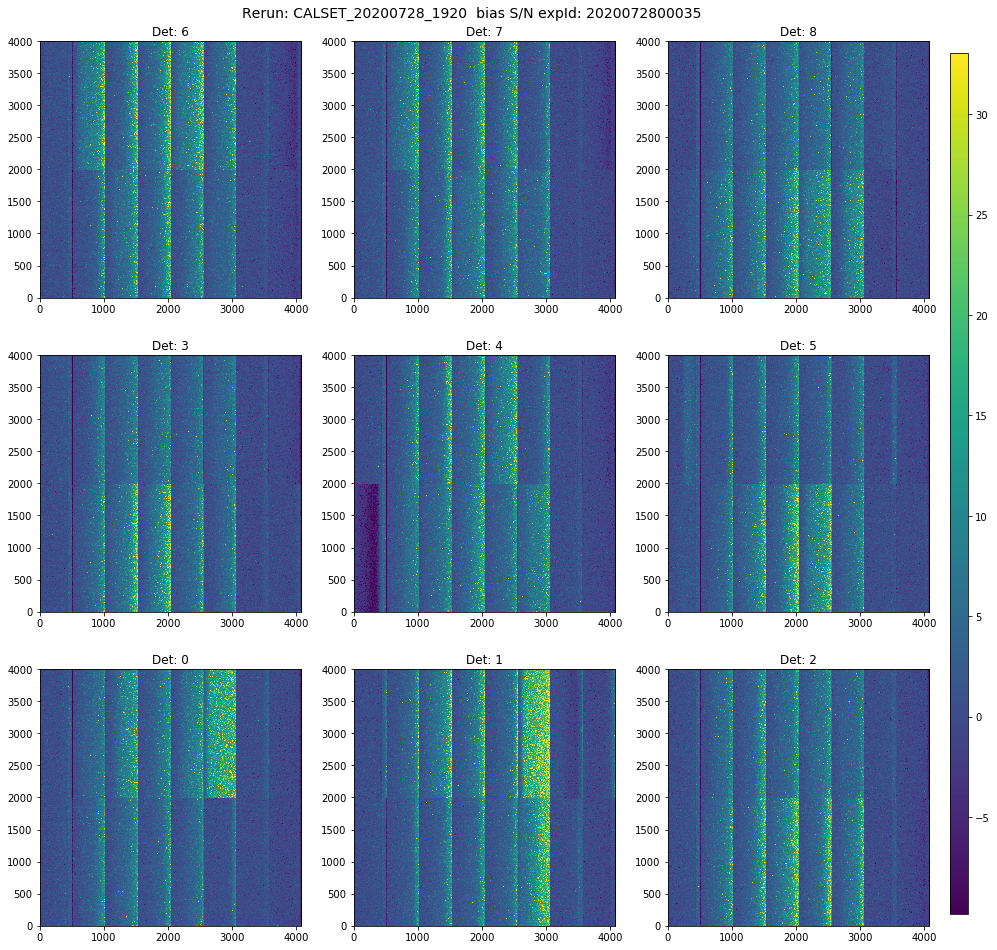

In [9]:
plotImages(expId, dataType, signalToNoise=True)

det    min      nanmin      max      nanmax    median    mean    stddev      var
 0   -123.48   -123.48     588.38     588.38     6.24    11.42    16.49    271.97
 1   -171.95   -171.95   53035.72   53035.72     5.67     9.74    21.03    442.34
 2   -400.36   -400.36     103.97     103.97     7.70    12.07    21.12    445.97
 3   -317.32   -317.32     445.22     445.22     5.81     9.48    16.99    288.65
 4   -151.99   -151.99    1291.32    1291.32     5.11     8.06    13.57    184.13
 5   -355.26   -355.26     108.95     108.95     5.32     9.81    16.92    286.44
 6   -258.50   -258.50   50977.31   50977.31     5.71    11.62    25.36    642.94
 7   -157.55   -157.55   11023.10   11023.10     4.49     9.16    14.04    197.14
 8   -229.25   -229.25     366.15     366.15     5.74     9.14    14.10    198.94


Text(0.5, 1.02, 'Rerun: CALSET_20200728_1920  bias: expId: 2020072800035')

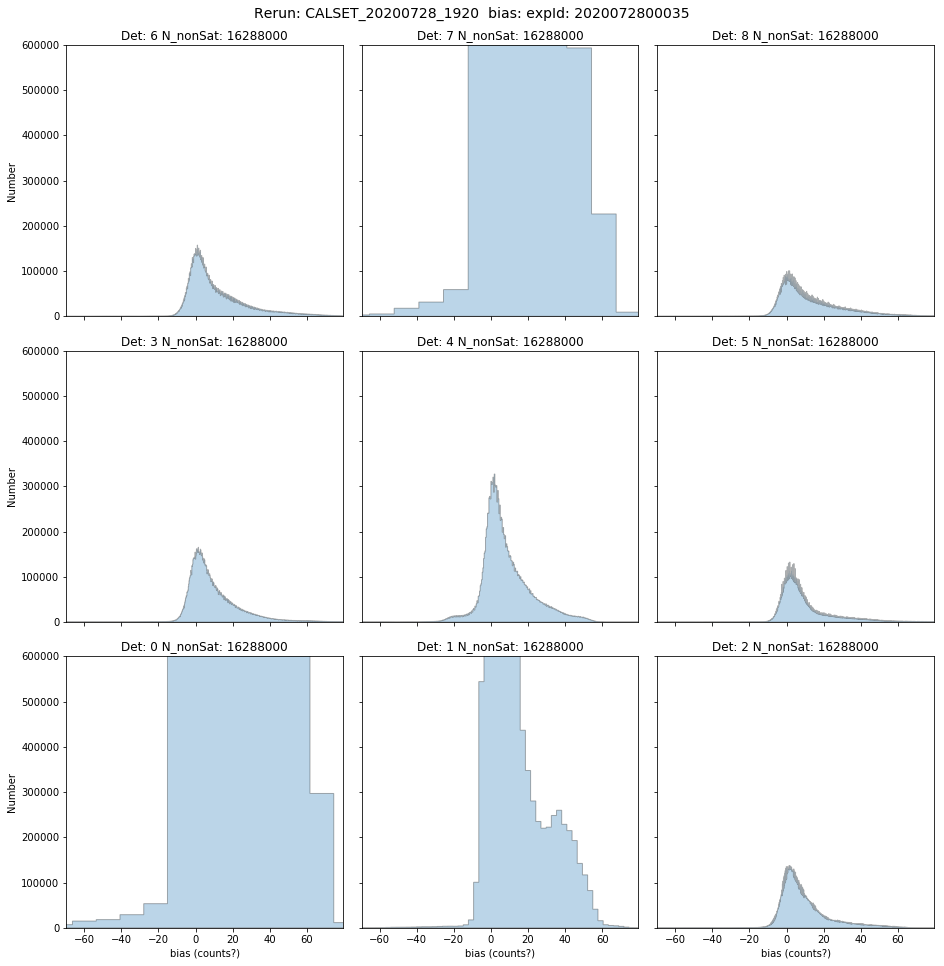

In [10]:
fig, axes = plt.subplots(3,3, figsize=(13, 13), constrained_layout=True)
histKwargs = dict(histtype='stepfilled', alpha=0.3, bins=4000, ec="k")
print("det    min      nanmin      max      nanmax    median    mean    stddev      var")
dataArr1DList = []
nonSatArrList = []
xmin, xmax = 1e12, -1e12
for iCcd, ax in enumerate(axes.flatten()):
    detNum = detectorOrder[iCcd]
    dataId = {'expId': expId, 'detector': detNum}
    dataImage = calibButler.get(dataType, dataId=dataId)
    dataArr1D = dataImage.maskedImage.image.array.ravel()
    dataArr1DList.append(dataArr1D)
    nonSatArr = dataArr1D[np.abs(dataArr1D) < saturationList[iCcd]]
    nonSatArrList.append(nonSatArr)
    xmin = min(xmin, np.percentile(nonSatArr, 0.5))
    xmax = max(xmax, np.percentile(nonSatArr, 99.5))
for iCcd, ax in enumerate(axes.flatten()):
    detNum = detectorOrder[iCcd]
    dataArr1D = dataArr1DList[iCcd]
    nData = len(dataArr1D)
    nanmin, nanmax = np.nanmin(dataArr1D), np.nanmax(dataArr1D)
    datamin, datamax = np.min(dataArr1D), np.max(dataArr1D)
    nanmedian, nanmean = np.nanmedian(dataArr1D), np.nanmean(dataArr1D)
    nanstd, nanvar = np.nanstd(dataArr1D), np.nanvar(dataArr1D)
    print("{:2d} {:9.2f} {:9.2f} {:10.2f} {:10.2f} {:8.2f} {:8.2f} {:8.2f} {:9.2f}".format(iCcd, datamin, nanmin, datamax, nanmax, nanmedian, nanmean, nanstd, nanvar))
    nonSatArr = nonSatArrList[iCcd]
    ax.hist(nonSatArr, label="Det: {}".format(iCcd), **histKwargs)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(0, 600000)
    ax.set_title("Det: {} N_nonSat: {}".format(detNum, len(nonSatArr)), fontsize=12)
for ax in axes.flat:
    ax.set(xlabel="{} (counts?)".format(dataType), ylabel="Number")
    ax.label_outer()

plt.suptitle("Rerun: {}  {}: expId: {}".format(rerun, dataType, expId), fontsize=14, y=1.02)

In [11]:
def plotDiffImages(expId, expId2, dataType, cmap="viridis", vMin=None, vMax=None, doPercentDiff=False):
    fig, axes = plt.subplots(3,3, figsize=(13, 13), constrained_layout=True)
    dataArrList = []
    vmin, vmax = 1e12, -1e12
    for iCcd, ax in enumerate(axes.flatten()):
        detNum = detectorOrder[iCcd]
        dataId = {'expId': expId, 'detector': detNum}
        dataImage = calibButler.get(dataType, dataId=dataId)
        dataArr = dataImage.maskedImage.image.array
        dataId2 = {'expId': expId2, 'detector': detNum}
        dataImage2 = calibButler2.get(dataType, dataId=dataId2)
        dataArr2 = dataImage2.maskedImage.image.array
        if doPercentDiff:
            diffArr = 200.0*((dataArr - dataArr2)/(dataArr + dataArr2))
        else:
            diffArr = dataArr - dataArr2
        dataArrList.append(diffArr)
        if vMin is None:
            vmin = min(vmin, np.percentile(diffArr.ravel(), 5))
        else:
            vmin = vMin
        if vMax is None:
            vmax = max(vmax, np.percentile(diffArr.ravel(), 95))
        else:
            vmax = vMax
    for iCcd, ax in enumerate(axes.flatten()):
        detNum = detectorOrder[iCcd]
        arr = dataArrList[iCcd]
        arr = np.nan_to_num(arr, posinf=0.0, neginf=0.0)
        ax.imshow(arr, vmin=vmin, vmax=vmax,  origin='lower', cmap=cmap, interpolation='nearest')
        ax.set_title("Det: {}".format(detNum), fontsize=12)
    mappable = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    mappable._A = []
    caxDim = [1.01, 0.04, 0.02, 0.92]
    cax = fig.add_axes(caxDim)
    plt.colorbar(mappable, cax=cax)
    percentStr = "Percent " if doPercentDiff else "Absolute "
    plt.suptitle(percentStr + "Difference Image CALIB {} - CALIB {} {}".format(rerun, rerun2, dataType), fontsize=14, y=1.01)

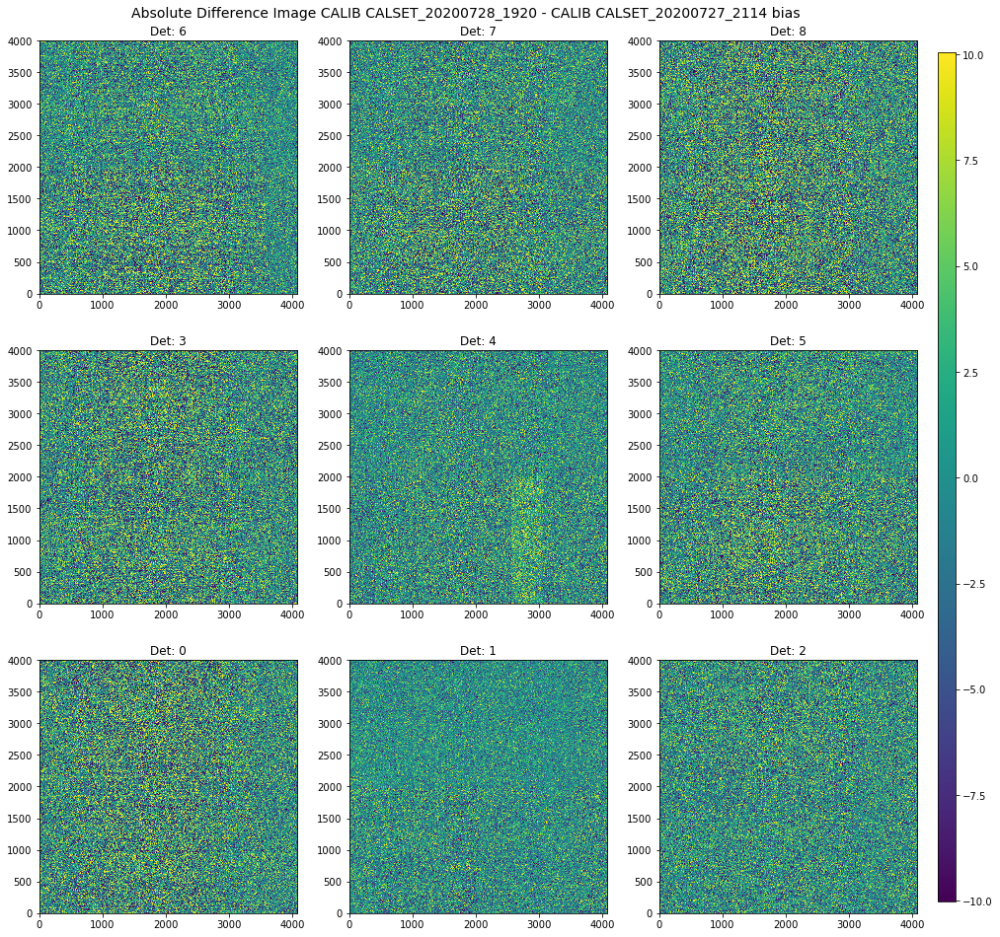

In [12]:
plotDiffImages(expId, expId2, dataType)

/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in true_divide
  


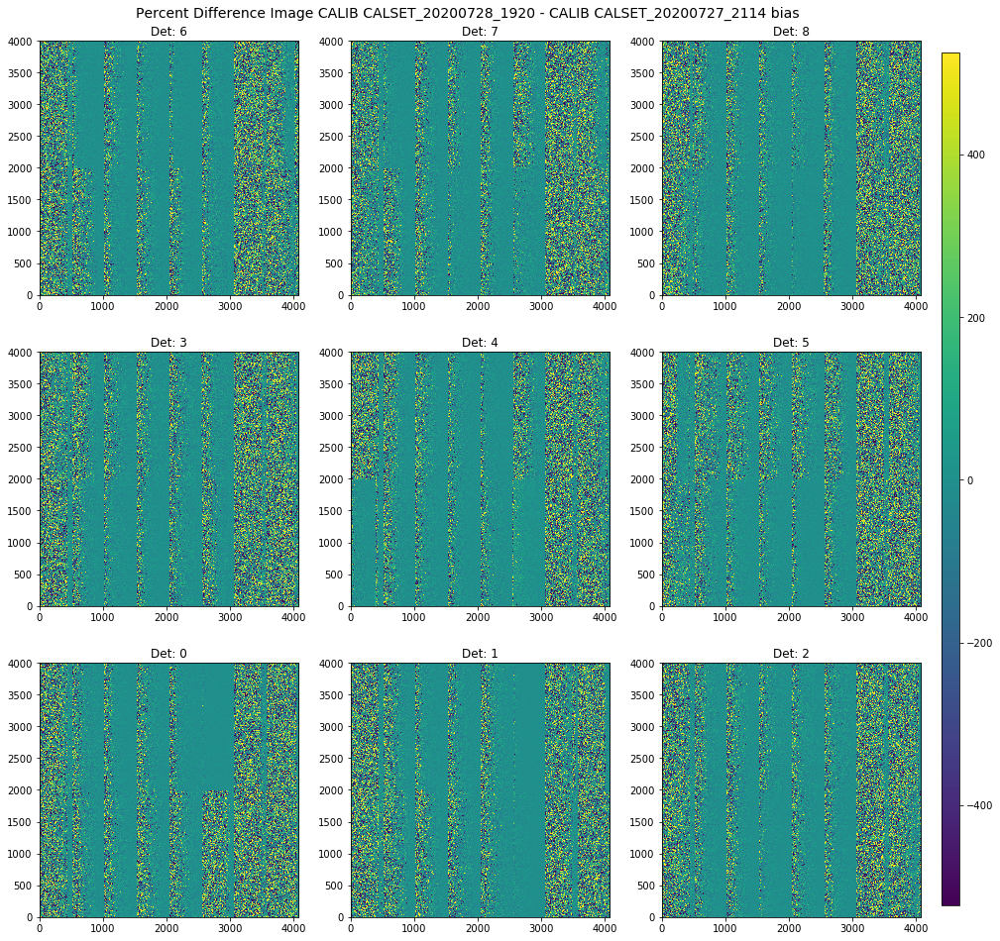

In [13]:
plotDiffImages(expId, expId2, dataType, doPercentDiff=True)

In [17]:
def plotDiffHists(expId, expId2, dataType, doPercentDiff=False):
    fig, axes = plt.subplots(3,3, figsize=(13, 13), constrained_layout=True)
    nBins = 1000000 if doPercentDiff else 1000
    ymax = 5000000 if doPercentDiff else 200000
    histKwargs = dict(histtype='stepfilled', alpha=0.5, bins=nBins)
    print("det     min        max     median     mean    stddev      var")
    dataArr1DList = []
    xmin, xmax = 1e12, -1e12
    for iCcd, ax in enumerate(axes.flatten()):
        detNum = detectorOrder[iCcd]
        dataId = {'expId': expId, 'detector': detNum}
        dataImage = calibButler.get(dataType, dataId=dataId)
        dataArr = dataImage.maskedImage.image.array
        dataId2 = {'expId': expId2, 'detector': detNum}
        dataImage2 = calibButler2.get(dataType, dataId=dataId2)
        dataArr2 = dataImage2.maskedImage.image.array
        if doPercentDiff:
            diffArr = 200*((dataArr - dataArr2)/(dataArr + dataArr2))
        else:
            diffArr = dataArr - dataArr2
        diffArr = np.nan_to_num(diffArr, posinf=0.0, neginf=0.0)
        diffArr1D = diffArr.ravel()
        dataArr1DList.append(diffArr1D)
        percentile = 5 if doPercentDiff else 0.1
        xmin = min(xmin, np.percentile(diffArr1D, percentile))
        xmax = max(xmax, np.percentile(diffArr1D, 100 - percentile))
    for iCcd, ax in enumerate(axes.flatten()):
        detNum = detectorOrder[iCcd]
        dataArr1D = dataArr1DList[iCcd]
        nanmin, nanmax = np.nanmin(dataArr1D), np.nanmax(dataArr1D)
        datamin, datamax = np.min(dataArr1D), np.max(dataArr1D)
        nanmedian, nanmean = np.nanmedian(dataArr1D), np.nanmean(dataArr1D)
        nanstd, nanvar = np.nanstd(dataArr1D), np.nanvar(dataArr1D)
        print("{:2d} {:9.2f} {:10.2f} {:8.2f} {:8.2f} {:8.2f} {:9.2f}".format(iCcd, datamin, datamax, nanmedian, nanmean, nanstd, nanvar))
        ax.hist(dataArr1D, label="Det: {}".format(detNum), **histKwargs)
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(0, ymax)
        ax.set_title("Det: {}".format(detNum, fontsize=12))
    percentStr = "Percent " if doPercentDiff else "Absolute "
    for ax in axes.flat:
        ax.set(xlabel=percentStr + "Difference: {}".format(dataType), ylabel="Number")
        ax.label_outer()
    plt.suptitle(percentStr + "{} Difference Distributions CALIB ({} - {})".format(dataType, rerun, rerun2), fontsize=14, y=1.01)

det     min        max     median     mean    stddev      var
 0    -33.94      33.16    -0.03    -0.02     5.28     27.88
 1  -1964.06      32.32     0.03     0.03     5.29     27.93
 2    -35.79      36.27    -0.00     0.00     6.10     37.27
 3    -33.56      33.70     0.01     0.01     5.75     33.04
 4    -98.16      28.31     0.09     0.10     4.55     20.69
 5    -32.80      32.64     0.05     0.05     5.30     28.14
 6  -3363.73      34.14     0.02     0.00     6.05     36.60
 7   -770.95      23.94     0.01    -0.00     3.97     15.79
 8    -26.67      26.29     0.02     0.01     4.81     23.12


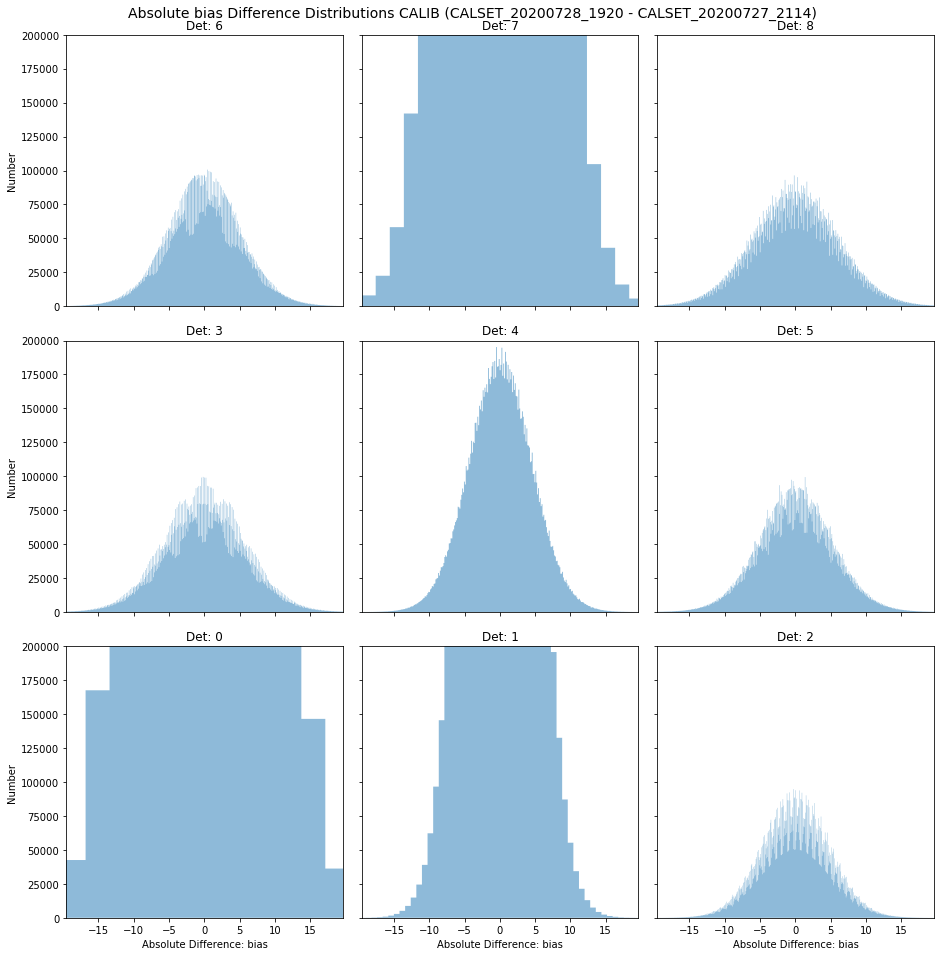

In [15]:
plotDiffHists(expId, expId2, dataType)

det     min        max     median     mean    stddev      var


/software/lsstsw/stack_20200515/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in true_divide


 0 -32620166.00 68780584.00    -0.11     6.75 30774.42 947064960.00
 1 -34729464.00 43676412.00     0.15    -8.32 35668.74 1272258816.00
 2 -47973196.00 23379738.00     0.15     1.16 26676.39 711629824.00
 3 -16749444.00 39033324.00     0.13     9.28 27263.65 743306368.00
 4 -21433432.00 41130464.00     1.43     3.73 19241.11 370220416.00
 5 -51257180.00 64153456.00     0.47    -5.74 36583.47 1338350464.00
 6 -44539080.00 18710368.00    -0.04    -6.70 22104.75 488620000.00
 7 -33870068.00 50632160.00    -0.07    11.37 28895.08 834925760.00
 8 -50138444.00 42044064.00     0.04   -15.70 30299.77 918075968.00


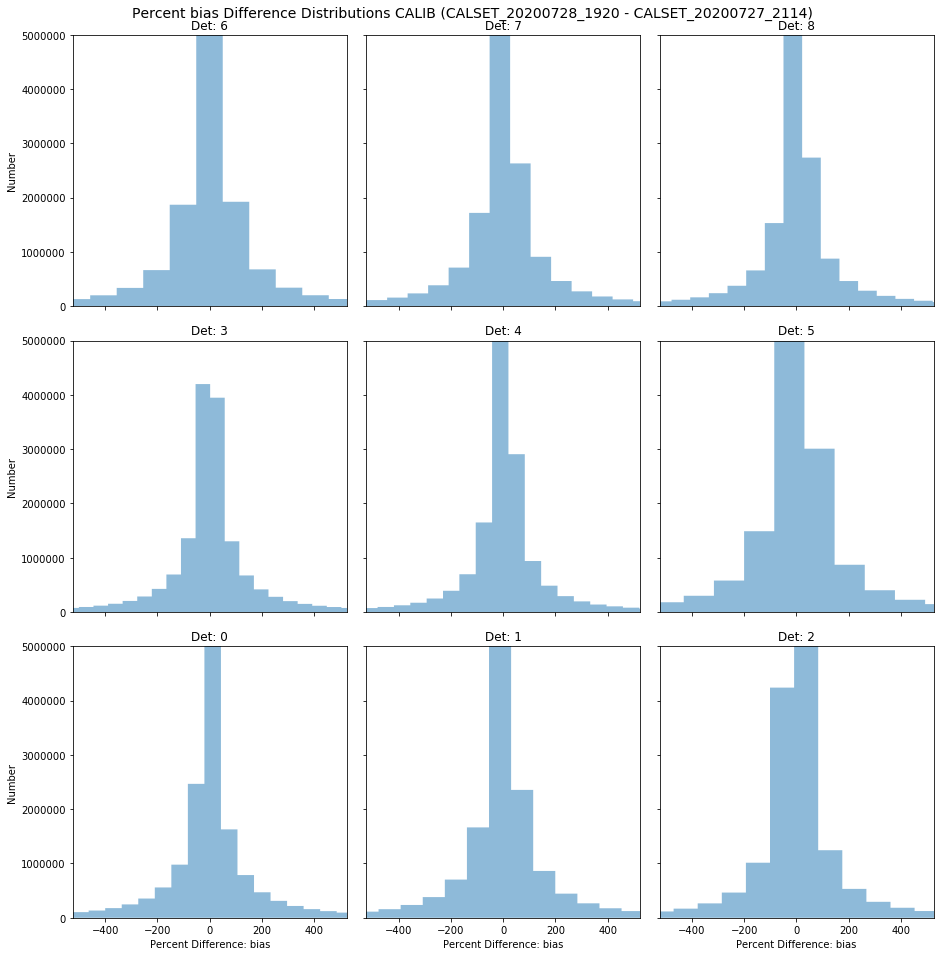

In [18]:
plotDiffHists(expId, expId2, dataType, doPercentDiff=True)